## File upload and download via IPFS

In [3]:
#clone ipfshttpclient
!git clone https://github.com/ipfs/py-ipfs-http-client.git

fatal: destination path 'py-ipfs-http-client' already exists and is not an empty directory.


In [16]:
#add to path
import sys
sys.path.append("py-ipfs-http-client")

In [17]:
import ipfshttpclient

In [18]:
ipfshttpclient.__version__

'0.7.0'

In [36]:
# please use go-ipfs 0.7.0 (which is not the current version) and make sure the ipfs daemon is running
client = ipfshttpclient.connect() 

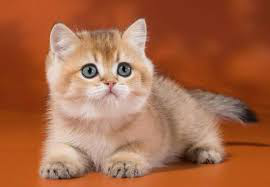

In [37]:
Image.open("cat.jpg")

In [38]:
# add image to ipfs 
res = client.add('cat.jpg')

In [39]:
res

<ipfshttpclient.client.base.ResponseBase: {'Name': 'cat.jpg', 'Hash': 'QmXnHiMuygZLLWYf3BEe6Wan2uXP9SVwJcC11pca2D22iV', 'Size': '5112'}>

In [40]:
# download with hash 
client.get('QmXnHiMuygZLLWYf3BEe6Wan2uXP9SVwJcC11pca2D22iV')

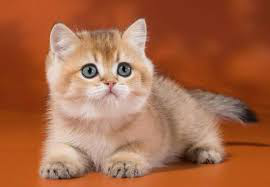

In [42]:
img = Image.open("QmXnHiMuygZLLWYf3BEe6Wan2uXP9SVwJcC11pca2D22iV")
img = img.convert('RGB')
img

## Image recognition, machine learning

In [3]:
import torch
import torch.nn
from torch.autograd.gradcheck import zero_gradients
import torch.nn.functional as F
import torchvision.models as models
from PIL import Image
from torchvision import transforms
import numpy as np
import requests, io
import matplotlib.pyplot as plt
from torch.autograd import Variable
%matplotlib inline

In [4]:
inceptionv3 = models.inception_v3(pretrained=True) 
inceptionv3.eval();

In [6]:
#mean and std will remain same irresptive of the model you use
mean=[0.485, 0.456, 0.406]
std=[0.229, 0.224, 0.225]

preprocess = transforms.Compose([
                transforms.Resize((299,299)),  
                transforms.ToTensor(),
                transforms.Normalize(mean, std)
            ])

In [31]:
import json
with open('./labels.json') as f:
  labels_json = json.load(f)

# labels_link = "https://f14r33.github.io/gae/labels.json"    

In [43]:
''' Pre-pocessing file '''
image_tensor = preprocess(img) #preprocess an i
image_tensor = image_tensor.unsqueeze(0) # add batch dimension.  C X H X W ==> B X C X H X W
img_variable = Variable(image_tensor, requires_grad=True) #convert tensor into a variable

''' Pass file to ML model and get the label index'''
output = inceptionv3.forward(img_variable)
label_idx = torch.max(output.data, 1)[1][0].item()   
print(label_idx)

283


In [44]:
''' Convert label index to label and the probability'''
labels = {int(idx):label for idx, label in labels_json.items()}
x_pred = labels[label_idx]
print('predicted label: ', x_pred)

#get probability dist over classes
output_probs = F.softmax(output, dim=1)
x_pred_prob =  np.round((torch.max(output_probs.data, 1)[0][0]) * 100,4)
print('prediction accuracy: {:.2f}%'.format(x_pred_prob))

predicted label:  Persian cat
prediction accuracy: 53.79%


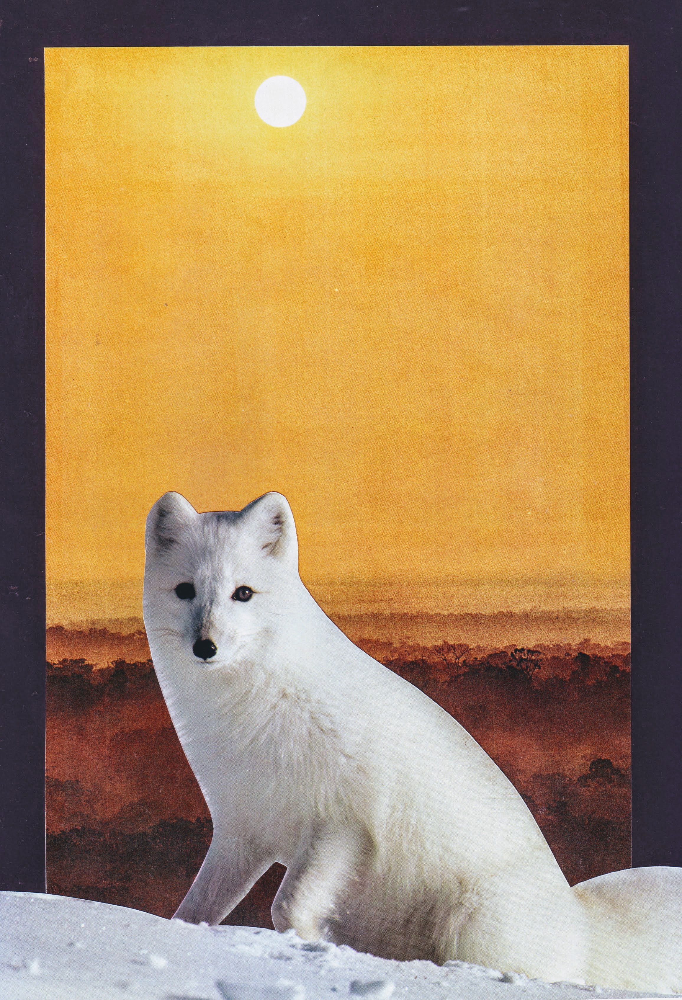

In [45]:
url = "https://ipfs.rarible.com/ipfs/QmdvztfxnwhnN9yFDHBwusFDUDTzvt4SP9pp4RjVgxCmyw/image.jpeg"
## https://rarible.com/token/0xd07dc4262bcdbf85190c01c996b4c06a461d2430:74393:0xb9d7a69f9ef6fc8c65568fca646462f6806d775f


response = requests.get(url)
img = Image.open(io.BytesIO(response.content))
img = img.convert('RGB')
img

In [46]:
''' Pre-pocessing file '''
image_tensor = preprocess(img) #preprocess an i
image_tensor = image_tensor.unsqueeze(0) # add batch dimension.  C X H X W ==> B X C X H X W
img_variable = Variable(image_tensor, requires_grad=True) #convert tensor into a variable

''' Pass file to ML model and get the label index'''
output = inceptionv3.forward(img_variable)
label_idx = torch.max(output.data, 1)[1][0].item()   
print(label_idx)

279


In [47]:
''' Convert label index to label and the probability'''
labels = {int(idx):label for idx, label in labels_json.items()}
x_pred = labels[label_idx]
print('predicted label: ', x_pred)

#get probability dist over classes
output_probs = F.softmax(output, dim=1)
x_pred_prob =  np.round((torch.max(output_probs.data, 1)[0][0]) * 100,4)
print('prediction accuracy: {:.2f}%'.format(x_pred_prob))

predicted label:  Arctic fox, white fox, Alopex lagopus
prediction accuracy: 91.35%
